Students:
- 0001138787 - Lorenzo Venturi - lorenzo.venturi14@studio.unibo.it
- 0001172880 - Chayan Talukder - chayan.talukder@studio.unibo.it

# **Product Recognition of Books**

## Image Processing and Computer Vision - Assignment Module \#1


Contacts:

- Prof. Giuseppe Lisanti -> giuseppe.lisanti@unibo.it
- Prof. Samuele Salti -> samuele.salti@unibo.it
- Alex Costanzino -> alex.costanzino@unibo.it
- Francesco Ballerini -> francesco.ballerini4@unibo.it

Computer vision-based object detection techniques can be applied in library or bookstore settings to build a system that identifies books on shelves.

Such a system could assist in:
* Helping visually impaired users locate books by title/author;
* Automating inventory management (e.g., detecting misplaced or out-of-stock books);
* Enabling faster book retrieval by recognizing spine text or cover designs.

## Task
Develop a computer vision system that, given a reference image for each book, is able to identify such book from one picture of a shelf.

<figure>
<a href="https://ibb.co/pvLVjbM5"><img src="https://i.ibb.co/svVx9bNz/example.png" alt="example" border="0"></a>
</figure>

For each type of product displayed on the shelf, the system should compute a bounding box aligned with the book spine or cover and report:
1. Number of instances;
1. Dimension of each instance (area in pixel of the bounding box that encloses each one of them);
1. Position in the image reference system of each instance (four corners of the bounding box that enclose them);
1. Overlay of the bounding boxes on the scene images.

<font color="red"><b>Each step of this assignment must be solved using traditional computer vision techniques.</b></font>

#### Example of expected output
```
Book 0 - 2 instance(s) found:
  Instance 1 {top_left: (100,200), top_right: (110, 220), bottom_left: (10, 202), bottom_right: (10, 208), area: 230px}
  Instance 2 {top_left: (90,310), top_right: (95, 340), bottom_left: (24, 205), bottom_right: (23, 234), area: 205px}
Book 1 – 1 instance(s) found:
.
.
.
```

## Data
Two folders of images are provided:
* **Models**: contains one reference image for each product that the system should be able to identify;
* **Scenes**: contains different shelve pictures to test the developed algorithm in different scenarios.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

!cp -r /content/drive/MyDrive/AssignmentsIPCV/dataset.zip ./
!unzip dataset.zip

Mounted at /content/drive
Archive:  dataset.zip
   creating: dataset/
   creating: dataset/scenes/
  inflating: dataset/.DS_Store       
  inflating: __MACOSX/dataset/._.DS_Store  
   creating: dataset/models/
  inflating: dataset/scenes/scene_9.jpg  
  inflating: __MACOSX/dataset/scenes/._scene_9.jpg  
  inflating: dataset/scenes/scene_8.jpg  
  inflating: __MACOSX/dataset/scenes/._scene_8.jpg  
  inflating: dataset/scenes/scene_20.jpg  
  inflating: __MACOSX/dataset/scenes/._scene_20.jpg  
  inflating: dataset/scenes/scene_21.jpg  
  inflating: __MACOSX/dataset/scenes/._scene_21.jpg  
  inflating: dataset/scenes/scene_23.jpg  
  inflating: __MACOSX/dataset/scenes/._scene_23.jpg  
  inflating: dataset/scenes/scene_22.jpg  
  inflating: __MACOSX/dataset/scenes/._scene_22.jpg  
  inflating: dataset/scenes/scene_26.jpg  
  inflating: __MACOSX/dataset/scenes/._scene_26.jpg  
  inflating: dataset/scenes/scene_27.jpg  
  inflating: __MACOSX/dataset/scenes/._scene_27.jpg  
  inflating: datas

## Evaluation criteria
1. **Clarity and conciseness**. Present your work in a readable way: format your code and comment every important step;

2. **Procedural correctness**. There are several ways to solve the assignment. Design your own sound approach and justify every decision you make;

3. **Correctness of results**. Try to solve as many instances as possible. You should be able to solve all the instances of the assignment, however, a thoroughly justified and sound procedure with a lower number of solved instances will be valued **more** than a poorly designed and justified approach that solves more or all instances.

# Project start

In [2]:
# Import useful libraries
import numpy as np
import os
import cv2
from matplotlib import pyplot as plt
from matplotlib import patches as patches
from collections import Counter
import re

## Utils functions

In [ ]:
def load_image(path: str, to_rgb: bool = False):
  """
  Read an image from a given path, if specified convert it to rgb
  args:
  - path: path to the image
  - to_rgb: if True convert the image to rgb
  return:
  - image: the loaded image
  """
  image = cv2.imread(path)
  if to_rgb:
    return cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
  else:
    return image

def print_image(image: np.ndarray, title: str = None):
  """
  Print the specified image
  args:
  - image: the image to print
  - title: the title of the image
  """
  if title is not None:
    plt.title(title)
  plt.imshow(image)
  plt.show()

def kp_detection_description(image:np.ndarray,
                             print_img:bool = False,
                             print_kp_numbers: bool =False,
                             contrast_threshold_sift: float=0.0005, #key parameter for finding enough keypoints
                             edge_threshold_sift: int=11,
                             sigma_sift:float=0.8,
                             nOctaveLayers_sift:int=4
                             ):
  """
  Detect keypoints in the specified image, then compute their descriptors.
  args:
  - image: the image to process
  - print_image: if True print the image with the detected keypoints
  - print_kp_numbers: if True print the number of detected keypoints
  - contrast_threshold_sift: parameter to filter out weak keypoints ( we made it low as to detect more keypoint (more sensitive))
  - edge_threshold: parameter set a bit higher, make Sift more permissive in detecting edges (useful for books case)
  - sigma_sift: parameter to control the level of the initial gaussian smoothing
  - n_octave_layer: parameter to have more guassian smoothing layers, downside is the increase of computation
  return:
  - kp_image: the detected keypoints
  - des_image: the computed descriptors
  """
  image=cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
  # Create a SIFT (Scale Invariant feature Trasform) detector instance
  sift=cv2.SIFT_create(nfeatures=47000,contrastThreshold=contrast_threshold_sift,edgeThreshold=edge_threshold_sift,sigma=sigma_sift,nOctaveLayers=nOctaveLayers_sift)
  # Detect the image keypoints
  kp_image=sift.detect(image)

  if print_img:
    image_kp=cv2.drawKeypoints(image,kp_image,None)
    print_image(image_kp)

  if print_kp_numbers:
    print(f"Number of keypoints: {len(kp_image)}")

  # Compute the SIFT descriptors for the detected keypoints
  kp_image,des_image=sift.compute(image,kp_image)

  if des_image is not None:
    if des_image.dtype !=np.float32:
        des_image = des_image.astype(np.float32)

  return kp_image,des_image

def initialize_flann():
  """
  Initialize the FLANN (Fast Library for Approximate Nearest Neighbors) matcher
  Returns:
        flann (cv2.FlannBasedMatcher): Initialized FLANN matcher object.
  """
  # Defining index for approximate kd_tree algorithm
  FLANN_INDEX_KDTREE = 1
  # Defining parameters for algorithm
  index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=20)
  # Defining search params.
  search_params = dict(checks=200)
  # Initializing matcher
  flann = cv2.FlannBasedMatcher(index_params, search_params)

  return flann

def feature_matching(flann:cv2.FlannBasedMatcher,des_model:np.ndarray, des_scene:np.ndarray,print_img=False):
  """
  Compute feature matching from descriptors of the scene compared to the descriptors of the model.
  In order to find the matches we will use efficient indexing technique based on the Kd_tree algorithm
  called FLANN included in OpenCV
  args:
  - flann: Initialized FLANN matcher.
  - des_model: the descriptors of the model
  - des_scene: the descriptors of the scene
  - print_image: if True print the image with the matching keypoints
  return:
  - good_matches: the matching keypoints
  """
  # Matching and finding the 2 closest elements for each model descriptor
  matches = flann.knnMatch(des_model, des_scene, k=2)
  # Calculate the good matches
  good_matches = []
  for m,n in matches:
      if m.distance < 0.7*n.distance:
          good_matches.append(m)
  return good_matches

def ransac_homography(kp_model, kp_scene, good_matches):
  """
  Estimate a robust homography using RANSAC.
  args:
  - kp_model: the keypoints of the model
  - kp_scene: the keypoints of the scene
  - good_matches: the matching keypoints
  return:
  - M: the estimated homography
  - mask: the mask of the discarded points
  """

  if len(good_matches) < 4:
        return None, None
  # Building the correspondence arrays of good matches
  src_pts = np.float32([kp_model[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
  dst_pts = np.float32([kp_scene[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)
  # Using RANSAC to estimate a robust homography.
  # It returns the homography M and a mask for the discarded points.
  M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 3.0,maxIters=5000,confidence=0.999)
  return M,mask

def apply_homography(image, M):
  """
  Apply the estimated homography to the image.
  args:
  - image: the image to apply the homography
  - M: the estimated homography
  return:
  - dst: the image with the homography applied
  """
  # Corners of the model image
  h, w = image.shape[:2]
  #define the corners of the model image
  pts = np.float32([[0,0], [0,h-1], [w-1,h-1], [w-1,0]]).reshape(-1, 1, 2)

  # Projecting the corners into the scene image
  dst = cv2.perspectiveTransform(pts, M)
  return dst

def delete_keypoints(scene_keypoints,scene_descriptors,contour):
  """
  Function to delete the keypoint already detected of a scene (inside the contour) in order to apply multi object detection.
  args:
  - scene_keypoints: the keypoints of the scene
  - scene_descriptors: the descriptors of the scene
  - contour: the contour of the model
  return:
  - scene_keypoints: the keypoints of the scene without the keypoints already detected of the model
  - scene_descriptors: the descriptors of the scene without the descriptors already detected of the model
  """
  keypoints_scene_remained = []
  descriptors_scene_remained = []
  for kp, des in zip(scene_keypoints, scene_descriptors):
      if cv2.pointPolygonTest(contour, kp.pt, False) == -1:
          keypoints_scene_remained.append(kp)
          descriptors_scene_remained.append(des)
  return keypoints_scene_remained, np.array(descriptors_scene_remained)

def calculate_area(corners):
  """
  Function to calculate the area defined by 4 corners
  args:
  - corners: array of 4 corner points
  return:
  - area: the area in pixels
  """
  # we use the shoelace formula for polygon area
  corners = corners.reshape(-1, 2)
  x = corners[:, 0]
  y = corners[:, 1]

  area = 0.5*abs(sum(x[i]*y[(i + 1)%4]-x[(i+1)%4] * y[i] for i in range(4)))
  return int(area)

## Detection Pipeline

The object detection pipeline **iterates** through each `scene_image` to identify occurrences of the `model_images`.  
Every time a valid match is found, the corresponding keypoints and descriptors are **removed** from the scene, allowing the search to continue.  
This strategy makes **multiple-instance detection** straightforward and efficient.

---

### 1. Model-to-Scene Matching Loop
For each `model_image` (representing a book to be detected) within a given scene, the following steps are executed.  
This process is repeated up to **MAX_INSTANCES_PER_MODEL**, enabling detection of multiple occurrences of the same object.

---

#### 1.1 Feature Detection (SIFT)
- **Algorithm**: SIFT (Scale-Invariant Feature Transform) is used for robust keypoint detection and descriptor extraction.  
- **Hyperparameter Optimization**: Parameters are tuned to detect even subtle keypoints, which is crucial for small or low-contrast objects (though at the cost of increased computation):  
  - **contrast_threshold_sift** = `0.0005` → allows detection of faint book instances  
  - **edge_threshold_sift** = `11` → slightly higher than the SIFT default (`10`), keeps more edge responses  
  - **sigma_sift** = `0.8` → smaller initial sigma, captures finer details  
  - **nOctaveLayers_sift** = `4` → adds an extra octave layer, enabling detection of more scale variations  

---

#### 1.2 Descriptor Matching (FLANN + KNN)
- **Matcher**: FLANN (Fast Library for Approximate Nearest Neighbors) provides efficient descriptor matching.  
- **Parameters**:  
  - `trees = 16`  
  - `checks = 200`  
- **Strategy**: K-Nearest Neighbors (KNN) retrieves the closest descriptor matches for each keypoint.  

---

#### 1.3 False Match Filtering (Lowe’s Ratio Test)
- **Criterion**: A match is valid only if the ratio between the closest and the second-closest descriptor distances is sufficiently small.  
- **Effect**: This ensures matches are **distinct and reliable**, discarding ambiguous correspondences.  

---

#### 1.4 Homography Estimation (RANSAC)
- **Algorithm**: RANSAC estimates the homography matrix `M`.  
- **Purpose**: Robustly handles outliers (false matches) and determines the geometric transformation between model and scene keypoints.  

---

#### 1.5 Object Localization
- **Transformation**: Once `M` is computed, the corners of the `model_image` are projected into the `scene_image`.  
- **Result**: This precisely localizes the detected object’s position in the scene.  

---

#### 1.6 Custom Match Validation
Each detection undergoes a **custom validation process**:  
- **Area Check** → Ensures bounding box area falls within predefined size limits.  
- **Angle Check** → Validates bounding box angles, allowing tolerance for perspective distortions (ideally near 90°).  
- **Color Matching** → Compares color histograms between the detected region and the `model_image`:  
  - Uses **cv2.HISTCMP_CHISQR** (Chi-Square distance).  
  - Threshold (`COLOR_HIST_THRESHOLD`) ensures detected object color matches the reference model.  
  - If colors do not match, detection is discarded — but its keypoints are still removed to allow discovery of other instances (e.g., books with same shape but different covers).  

---

### 2. Keypoint Removal and Visualization
- **Keypoint Removal**: Keypoints and descriptors from validated detections are removed from the scene, preventing duplicate detections of the same instance.  
- **Output Summary**: Reports the number of instances found per model after processing each scene.  
- **Visualization**:  
  - If no detections → only the `final_scene_image` is displayed.  
  - If detections exist → `final_scene_image` is displayed with bounding boxes, alongside the corresponding detected `model_images`.  

---

With this pipeline and tuned hyperparameters, **all book instances are successfully detected** across the scenes.


In [4]:
# compute the path to extract all the model and scene images
dataset_path = 'dataset'
models_path = os.path.join(dataset_path, 'models')
scenes_path = os.path.join(dataset_path, 'scenes')

In [5]:
# Load the model images sorted by index correctly
model_image_files = sorted([
    os.path.join(models_path, fname)
    for fname in os.listdir(models_path)
    if fname.lower().endswith(('.jpg', '.png'))
], key=lambda x: int(re.search(r'(\d+)\.', os.path.basename(x)).group(1)))
models_images = [load_image(path, to_rgb=True) for path in model_image_files]

# Load the scene images sorted by index correctly
scene_image_files = sorted([
    os.path.join(scenes_path, fname)
    for fname in os.listdir(scenes_path)
    if fname.lower().endswith(('.jpg', '.png'))
], key=lambda x: int(re.search(r'(\d+)\.', os.path.basename(x)).group(1)))
scene_images = [load_image(path,to_rgb=True) for path in scene_image_files]

We extract the models and scene keypoints and descriptors and save them into arrays, to ease the following computation.

In [6]:
kp_models=[]
kp_scenes=[]
des_models=[]
des_scenes=[]
for img in models_images:
    kp, des = kp_detection_description(img)
    kp_models.append(kp)
    des_models.append(des)

for img in scene_images:
    kp, des = kp_detection_description(img)
    kp_scenes.append(kp)
    des_scenes.append(des)

# Validation Functions

Every detected instance undergoes a series of validation checks to ensure that only **reliable matches** are retained.  
These checks help filter out **false positives** caused by noise, perspective distortions, or visually similar but incorrect regions (books with same front but different colors etc..)

## 1 Area Check
- The pixel area of the detected bounding box is computed.  
- The detection is considered valid only if the area lies within predefined **minimum and maximum thresholds**.  
- This prevents extremely small detections (noise) or excessively large ones (spurious matches) ( due to SIFT being very sensitive with the hyperparameters set)

## 2 Rectangularity Check
- The area found is examined to verify if it resembles a rectangle.  
- This is done by calculating the **cosine of the angles** between adjacent edges.  
- Ideally, these values should be close to 0 (since cos(90°) = 0).  
- A tolerance is applied to account for **perspective distortions** and imperfect homography estimations.  

## 3 Color Consistency Check
- The **color histogram** of the detected region is extracted and compared against the histogram of the reference model.  
- A **Chi-square distance** metric is used to quantify similarity.  
- If the distance is below a chosen threshold, the detection is considered color-consistent.  
- This step prevents keeping matches that are geometrically correct but **visually inconsistent** (e.g., books with similar shapes but different covers).  


In [ ]:
def get_hist(img,bins=(8,8,8)):
    """
    Function to compute the color histogram of an image.
    args:
    - img: the image to compute the histogram
    - bins: the number of bins for each color channel
    return:
    - hist: the histogram of the image
    """
    hist = cv2.calcHist([img],[0, 1, 2],None,bins,[0, 180, 0, 256, 0, 256])
    hist = cv2.normalize(hist, hist).flatten()
    return hist

def plot_histogram(hist, title, color_space='HSV'):
    """
    Function useful to plot the histogram of an image.
    """
    plt.figure()
    plt.title(title)
    plt.xlabel("Bins")
    plt.ylabel("Frequency")

    colors=('b','g','r')
    for i, color in enumerate(colors):
        plt.plot(hist[i], color=color)
    plt.show()

def visualize_histograms(img_query, roi_train):
    """
    Function to visualize the histograms of the query image and the ROI in the train image.
    """
    hist_query = get_hist(img_query)
    hist_roi_train = get_hist(roi_train)

    # Visualize histograms
    plot_histogram(hist_query, "Histogram for Query Image")
    plot_histogram(hist_roi_train, "Histogram for ROI in Train Image")

def get_angle_cos(p0,p1,p2):
    """
    Function to calculate the cosine of the angle at vertex p1.
    args:
    - p0: the first vertex
    - p1: the second vertex
    - p2: the third vertex
    return:
    - the cosine of the angle at vertex p1
    """
    v1 = np.array(p0, dtype=np.float32)-np.array(p1, dtype=np.float32)
    v2 = np.array(p2, dtype=np.float32)-np.array(p1, dtype=np.float32)
    dot_product = np.dot(v1, v2)
    norm_product = np.linalg.norm(v1) * np.linalg.norm(v2)
    if norm_product == 0:
        return 1.0
    return dot_product / norm_product

def check_valid(corners,scene_image,hist_model,min_area,max_area,angle_cos_tolerance,color_threshold1):
    """
    Function to validate a detected shape based on area, rectangularity and color match.
    args:
    - corners: the corners of the detected shape
    - hist_model: the histogram of the model image
    - min_area: the minimum area to be considered valid
    - max_area: the maximum area to be considered valid
    - angle_cos_tolerance: the tolerance for the cosine of the angle at vertex p1
    - color_threshold: the threshold for the color match
    return:
    - True if the shape is valid, False+reason otherwise
    """
    # reshape the corners to a (4,2)
    pts = corners.reshape(4, 2)

    # custom check 1 -> we check that the area is between the min and max
    area = cv2.contourArea(corners)
    if area < min_area or area>max_area:
      return False, f"Area ({area:.0f}) is below minimum ({min_area})"

    # custom check 2 -> we check the angle regularity, the cosine of 90° is zero, we allow a small tolerance
    cos_angles = [abs(get_angle_cos(pts[i - 1],pts[i],pts[(i+1)%4])) for i in range(4)]
    if any(c > angle_cos_tolerance for c in cos_angles):
      reason = f"Not rectangular (max cos: {max(cos_angles):.2f} > {angle_cos_tolerance})"
      return False, reason


    # custom check 3 -> color matching using the Chi square distance (lower the better)

    # Start by checking if the image is b/w, if yes skip the color matching and return true
    r, g, b = cv2.split(scene_image)
    if (np.array_equal(b, g) and np.array_equal(b, r)):
      return True,"Valid"

    # We get the rotated rectangle bounding box for a clean ROI
    rect = cv2.minAreaRect(pts)
    box = cv2.boxPoints(rect)
    box_int = np.int32(box)

    # We create a mask
    mask_roi = np.zeros(scene_image.shape[:2],dtype=np.uint8)

    # We fill the polygon created
    cv2.fillPoly(mask_roi,[box_int],255)

    # We extract the ROI from the scene image (converted to HSV)
    scene_image_hsv = cv2.cvtColor(scene_image, cv2.COLOR_RGB2HSV)

    # Calculate histogram of the detected ROI in the scene using the mask
    hist_roi_scene =cv2.calcHist([scene_image_hsv], [0, 1, 2], mask_roi,(8,8,8),[0,180,0,256,0,256])
    hist_roi_scene =cv2.normalize(hist_roi_scene, hist_roi_scene).flatten()

    # We compare the histograms (if the distance is under the threshold we return true)
    color_similarity_distance1 = cv2.compareHist(hist_model, hist_roi_scene, cv2.HISTCMP_CHISQR)
    if color_similarity_distance1 >= color_threshold1:
      return False,"Colors do not match"


    return True, "Valid"

### Drawing boxes function on the scene image

In [ ]:
# colors different to draw each bounding box of different models in the same scene
MODEL_COLORS = [
    (0,255,0),
    (255,0,0),
    (0,0,255),
    (0,255,255),
    (255,255,0),
    (255,0,255),
]
def draw_bounding_box(result_image, dst,color):
  """
  Function to draw a bounding box around the detected shape.
  args:
  - result_image: the image to draw the bounding box
  - dst: the corners of the detected shape
  """
  dst_reshaped = dst.reshape(4, 2)

  # We get the rotated rectangle that tightly encloses the projected corners
  rect =cv2.minAreaRect(dst_reshaped)

  # We get the four corners of this rotated rectangle
  box = cv2.boxPoints(rect)

  # We convert the points to integers for drawing
  box =np.int32(box)

  # Draw the bounding box using the corners of the rotated rectangle
  cv2.polylines(result_image,[box],True,color,2,lineType=cv2.LINE_AA)

## Visualization example and test of the process
In the next block of code we will show the keypoints handling inside the image and the matches.

We visually show how the keypoint mastches are consequently found and removed.

In [15]:
# Test with specific model and scene images
model_index = 12
scene_index = 17

In [10]:
# Parameters
MIN_MATCH_COUNT = 20  # Minimum matches for reliable homography
MAX_INSTANCES = 4     # Maximum number of instances to detect
MIN_DETECTION_AREA    = 1000
MAX_DETECTION_AREA    = 70000
ANGLE_COS_TOLERANCE   = 0.64    # Cosine tolerance for angles
COLOR_HIST_THRESHOLD  = 200     # Color histogram threshold
KP_RETENTION_T        = 0.68    # Threshold for retaining keypoints after validation

Model image


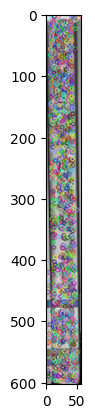

Scene image


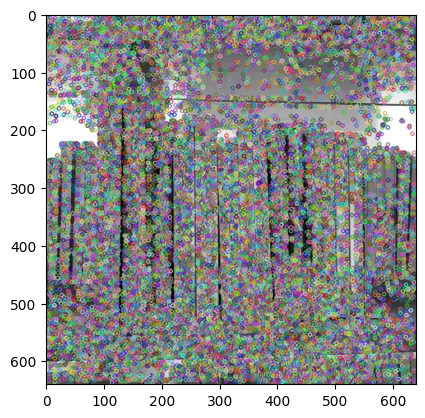

Instance 1: Found 332 good matches


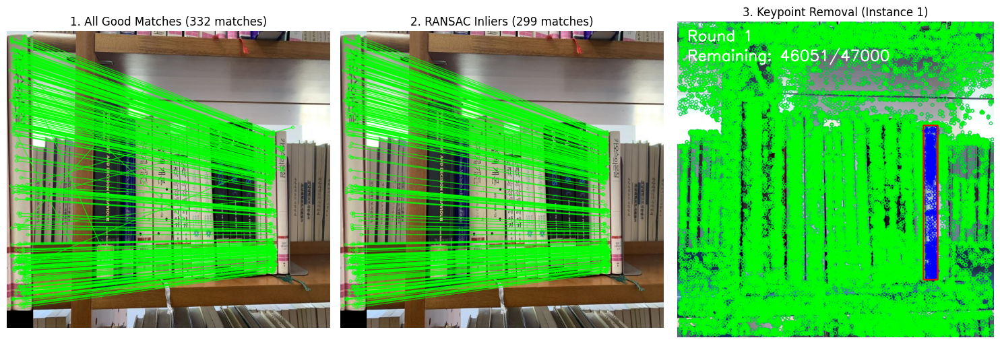

Instance 2: Found 70 good matches


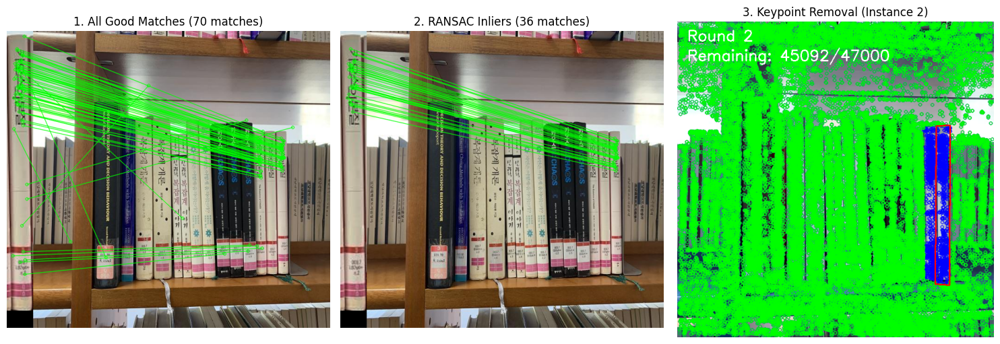

Instance 3: Found 49 good matches


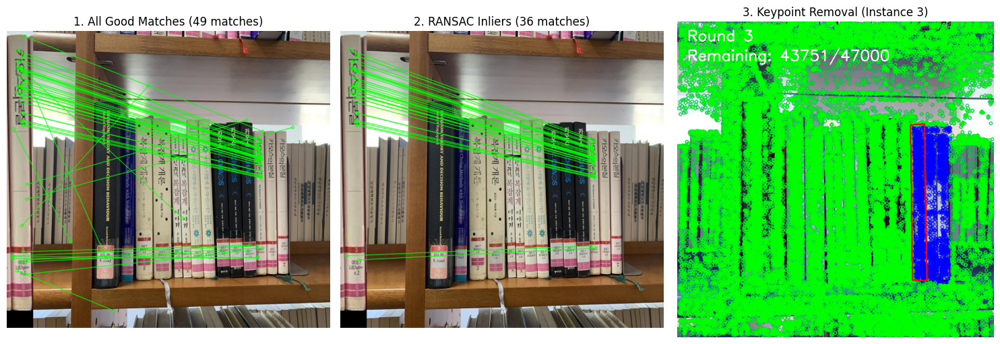

Instance 4: Found 13 good matches
Not enough good matches (13/20) for instance 4


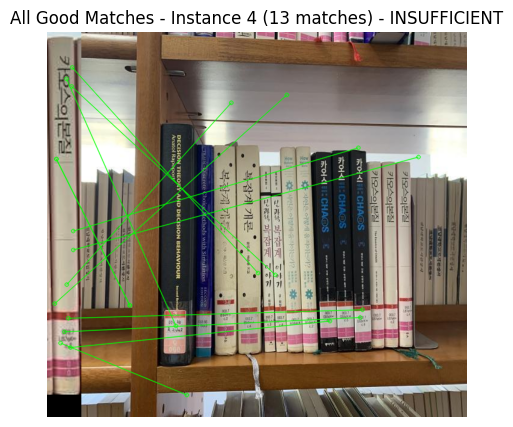

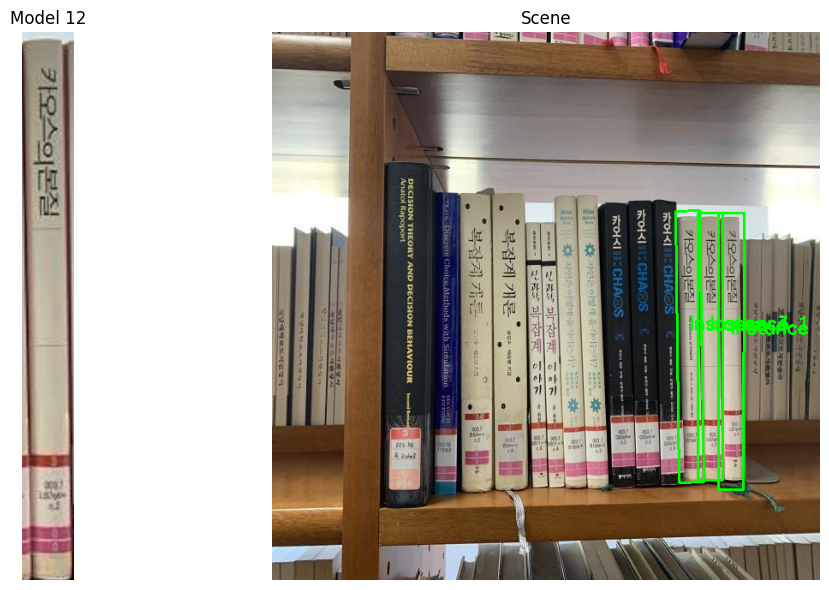

In [17]:
# Detect keypoints and descriptors
print("Model image")
kp_model, des_model = kp_detection_description(models_images[model_index], print_img=True, print_kp_numbers=False)
print("Scene image")
kp_scene, des_scene = kp_detection_description(scene_images[scene_index], print_img=True, print_kp_numbers=False)

# Initialize FLANN matcher
flann = initialize_flann()

# Make copies of scene keypoints and descriptors to modify
remaining_kp_scene = list(kp_scene)
remaining_des_scene = des_scene.copy() if des_scene is not None else None

# Prepare result image
result_image = scene_images[scene_index].copy()
instances = []

# Pre-convert model image to HSV for histogram comparison
model_image_hsv = cv2.cvtColor(models_images[model_index], cv2.COLOR_RGB2HSV)
hist_model = get_hist(model_image_hsv)

#---------------------------------------
# main loop to detect multiple instances
#---------------------------------------
for instance_num in range(MAX_INSTANCES):
    current_instance_kp_scene = remaining_kp_scene

    # Find matches with remaining keypoints
    good_matches = feature_matching(flann, des_model, remaining_des_scene, print_img=False)

    print(f"Instance {instance_num + 1}: Found {len(good_matches)} good matches")

    if len(good_matches) < MIN_MATCH_COUNT:
        print(f"Not enough good matches ({len(good_matches)}/{MIN_MATCH_COUNT}) for instance {instance_num + 1}")
        matches_img = cv2.drawMatches(
            models_images[model_index], kp_model,
            scene_images[scene_index], current_instance_kp_scene,
            good_matches, None,
            matchColor=(0,255,0), singlePointColor=None, flags=2
        )
        plt.figure(figsize=(10,5))
        plt.imshow(matches_img)
        plt.title(f"All Good Matches - Instance {instance_num+1} ({len(good_matches)} matches) - INSUFFICIENT")
        plt.axis('off')
        plt.show()
        break

    # Estimate homography with remaining keypoints
    M, mask = ransac_homography(kp_model, current_instance_kp_scene, good_matches)

    if M is None:
        print(f"Homography estimation failed for instance {instance_num + 1}")
        break


    # 1. Image for "All Good Matches"
    matches_img = cv2.drawMatches(
        models_images[model_index], kp_model,
        scene_images[scene_index], current_instance_kp_scene,
        good_matches, None,
        matchColor=(0,255,0),singlePointColor=None,flags=2
    )

    # 2. Image for "RANSAC Inliers"
    matches_mask = mask.ravel().tolist()
    draw_params = dict(matchColor=(0, 255, 0), singlePointColor=None, matchesMask=matches_mask, flags=2)
    inlier_img = cv2.drawMatches(models_images[model_index], kp_model, scene_images[scene_index],current_instance_kp_scene,good_matches,None,**draw_params)

    # 3. Image for "Keypoint Removal"
    dst = apply_homography(models_images[model_index], M)
    next_remaining_kp, next_remaining_des = delete_keypoints(current_instance_kp_scene, remaining_des_scene, dst)
    deleted_kp_img = scene_images[scene_index].copy()
    cv2.drawKeypoints(deleted_kp_img, kp_scene, deleted_kp_img, color=(255,0,0), flags=0) # Original KPs in Blue
    cv2.drawKeypoints(deleted_kp_img, next_remaining_kp, deleted_kp_img, color=(0,255,0), flags=0) # Remaining KPs in Green
    cv2.polylines(deleted_kp_img, [np.int32(dst)], True, (0,0,255), 2) # Current detection in Red
    cv2.putText(deleted_kp_img, f"Round {instance_num+1}", (20,40), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)
    cv2.putText(deleted_kp_img, f"Remaining: {len(next_remaining_kp)}/{len(kp_scene)}", (20,80), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)

    # plot visualization
    fig,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(15,5))

    ax1.imshow(matches_img)
    ax1.set_title(f"1. All Good Matches ({len(good_matches)} matches)")
    ax1.axis('off')

    ax2.imshow(inlier_img)
    ax2.set_title(f"2. RANSAC Inliers ({sum(matches_mask)} matches)")
    ax2.axis('off')

    ax3.imshow(cv2.cvtColor(deleted_kp_img, cv2.COLOR_BGR2RGB))
    ax3.set_title(f"3. Keypoint Removal (Instance {instance_num+1})")
    ax3.axis('off')

    plt.tight_layout()
    plt.show()

    #check if the match found is valid
    valid,reason = check_valid(dst,scene_images[scene_index],hist_model,MIN_DETECTION_AREA,MAX_DETECTION_AREA, ANGLE_COS_TOLERANCE,COLOR_HIST_THRESHOLD)
    area = calculate_area(dst)

    # we build the box in the scene image
    box = np.int32(cv2.boxPoints(cv2.minAreaRect(dst.reshape(4, 2))))
    cv2.polylines(result_image,[box],True,(0,255,0),2)
    center_x,center_y = int(np.mean(box[:,0])),int(np.mean(box[:,1]))
    cv2.putText(result_image, f"Instance {instance_num + 1}", (center_x,center_y-20),cv2.FONT_HERSHEY_SIMPLEX, 0.7,(0,255,0),2)

    # we keep the remaining keypoints to continue the search
    remaining_kp_scene, remaining_des_scene = next_remaining_kp, next_remaining_des

    if remaining_des_scene is None or len(remaining_des_scene) < MIN_MATCH_COUNT:
        print("Not enough remaining descriptors for further detection")
        break

# Final result of the process
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.imshow(models_images[model_index])
plt.title(f"Model {model_index}")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(result_image)
plt.title(f"Scene")
plt.axis('off')

plt.tight_layout()
plt.show()

## Hyperparameters and parameters setting for the loop detection

In [ ]:
# -----------------------
# Parameters and utilities
# -----------------------

# Matching settings
MIN_MATCH_COUNT        = 25      # Minimum number of keypoint matches to qualify as a valid detection
MAX_INSTANCES_PER_MODEL = 5      # Max occurrences of the same model in a scene (limits computation)

# Detection area constraints (in pixels)
MIN_DETECTION_AREA     = 1000   # Minimum bounding box area to be considered valid
MAX_DETECTION_AREA     = 70000  # Maximum bounding box area to filter out implausibly large detections

# Geometric validation
ANGLE_COS_TOLERANCE    = 0.64    # Cosine tolerance for angles

# Appearance validation
COLOR_HIST_THRESHOLD   = 200     # Color histogram threshold (robust to illumination variance between books)

# Keypoint management
KP_RETENTION_T         = 0.68    # Threshold for retaining keypoints after validation


## Detection loop

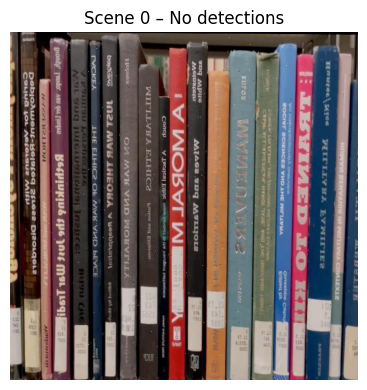

Scene 1 Book 18 – 2 instance(s) found:
 Instance 1 {top_left: (441, 42), top_right: (490, 42),bottom_left: (441, 520),  bottom_right: (490, 520),area: 23422px}
 Instance 2 {top_left: (489, 41), top_right: (536, 39),bottom_left: (482, 513),  bottom_right: (530, 518),area: 22596px}


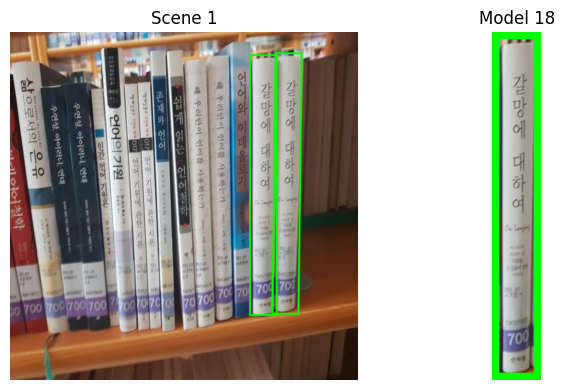

Scene 2 Book 17 – 1 instance(s) found:
 Instance 1 {top_left: (283, 25), top_right: (318, 25),bottom_left: (283, 503),  bottom_right: (318, 503),area: 16730px}


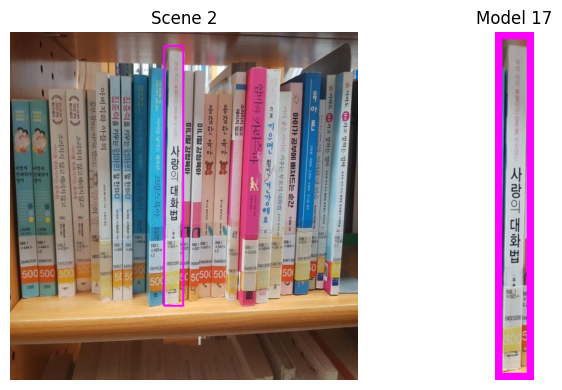

Scene 3 Book 16 – 2 instance(s) found:
 Instance 1 {top_left: (377, 209), top_right: (425, 209),bottom_left: (377, 542),  bottom_right: (425, 542),area: 15984px}
 Instance 2 {top_left: (425, 210), top_right: (474, 209),bottom_left: (418, 549),  bottom_right: (466, 548),area: 16434px}


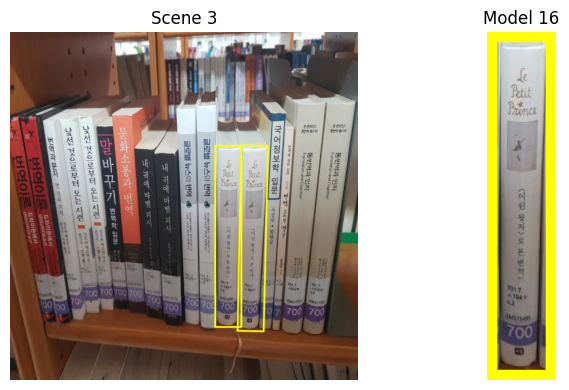

Scene 4 Book 14 – 2 instance(s) found:
 Instance 1 {top_left: (92, 1), top_right: (135, 1),bottom_left: (92, 617),  bottom_right: (135, 617),area: 26488px}
 Instance 2 {top_left: (55, -3), top_right: (98, -2),bottom_left: (59, 618),  bottom_right: (102, 619),area: 26699px}
Scene 4 Book 15 – 2 instance(s) found:
 Instance 1 {top_left: (226, 48), top_right: (267, 48),bottom_left: (226, 608),  bottom_right: (267, 608),area: 22960px}
 Instance 2 {top_left: (191, 43), top_right: (234, 44),bottom_left: (197, 608),  bottom_right: (238, 607),area: 23688px}


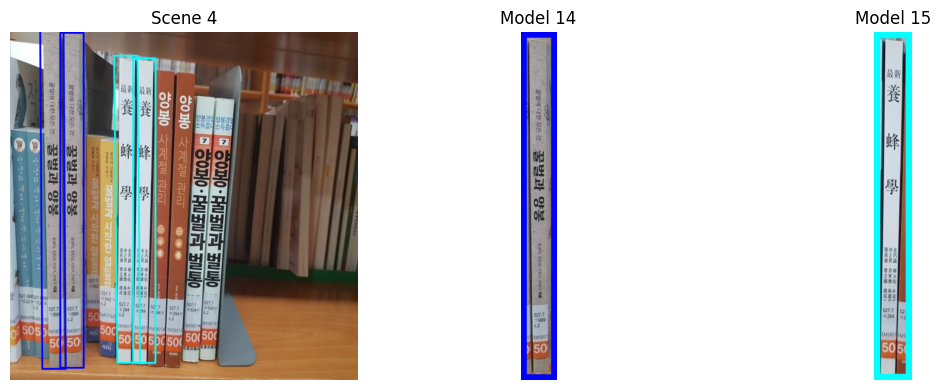

Scene 5 Book 13 – 1 instance(s) found:
 Instance 1 {top_left: (102, 69), top_right: (145, 69),bottom_left: (102, 572),  bottom_right: (145, 572),area: 21629px}


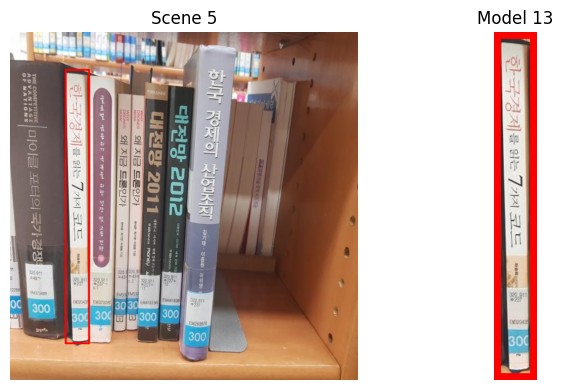

Scene 6 Book 21 – 1 instance(s) found:
 Instance 1 {top_left: (217, 73), top_right: (270, 73),bottom_left: (217, 563),  bottom_right: (270, 563),area: 25970px}


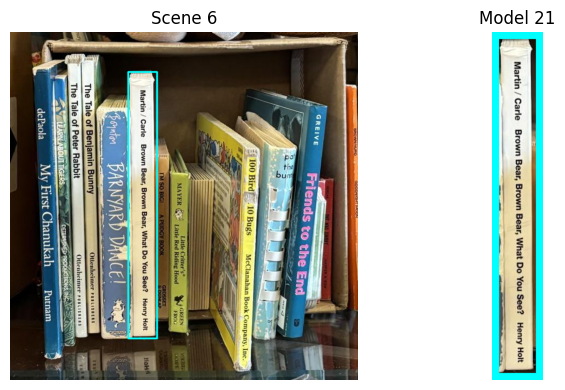

Scene 7 Book 20 – 2 instance(s) found:
 Instance 1 {top_left: (236, 173), top_right: (289, 173),bottom_left: (236, 555),  bottom_right: (289, 555),area: 20246px}
 Instance 2 {top_left: (279, 171), top_right: (334, 170),bottom_left: (276, 560),  bottom_right: (330, 562),area: 21284px}


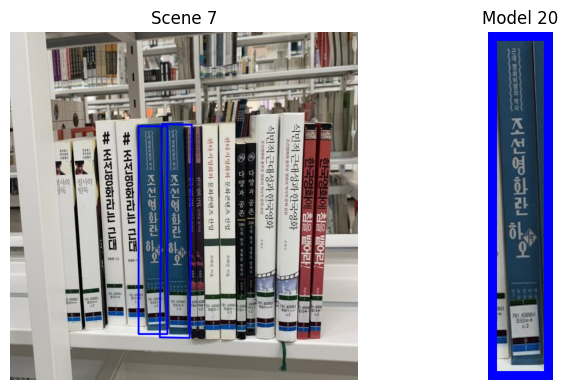

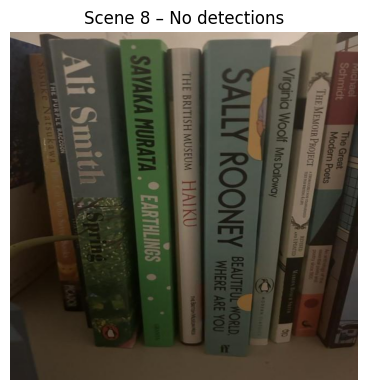

Scene 9 Book 19 – 4 instance(s) found:
 Instance 1 {top_left: (440, 328), top_right: (438, 356),bottom_left: (137, 338),  bottom_right: (138, 366),area: 8437px}
 Instance 2 {top_left: (438, 302), top_right: (438, 332),bottom_left: (134, 311),  bottom_right: (138, 340),area: 8926px}
 Instance 3 {top_left: (439, 355), top_right: (441, 384),bottom_left: (139, 366),  bottom_right: (139, 394),area: 8589px}
 Instance 4 {top_left: (442, 381), top_right: (442, 409),bottom_left: (139, 392),  bottom_right: (142, 420),area: 8458px}


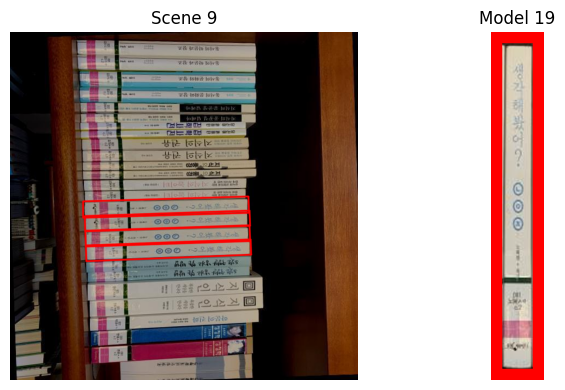

Scene 10 Book 19 – 4 instance(s) found:
 Instance 1 {top_left: (332, 203), top_right: (359, 203),bottom_left: (332, 503),  bottom_right: (359, 503),area: 8100px}
 Instance 2 {top_left: (307, 201), top_right: (335, 203),bottom_left: (304, 502),  bottom_right: (332, 500),area: 8372px}
 Instance 3 {top_left: (359, 201), top_right: (387, 203),bottom_left: (359, 504),  bottom_right: (387, 501),area: 8414px}
 Instance 4 {top_left: (386, 201), top_right: (413, 200),bottom_left: (386, 501),  bottom_right: (413, 505),area: 8167px}


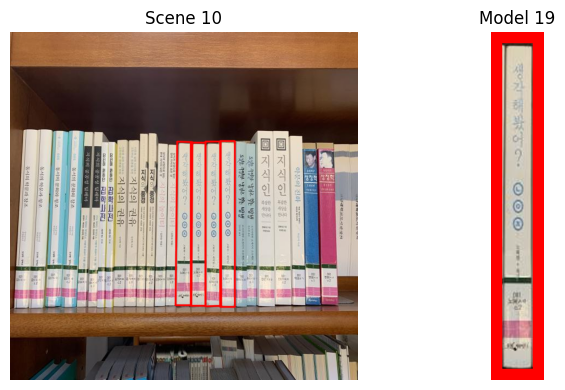

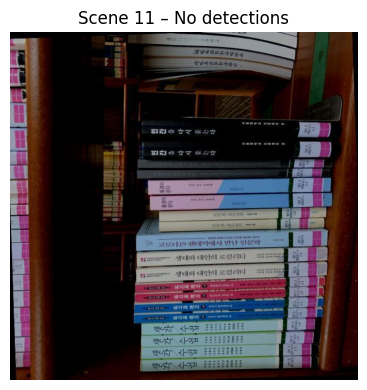

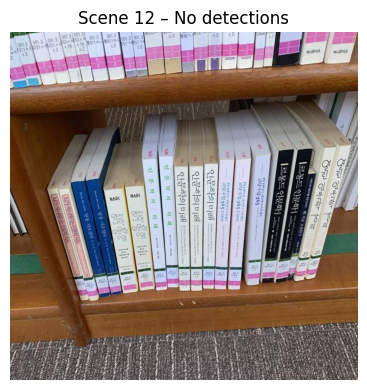

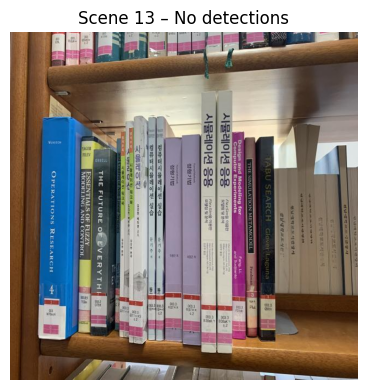

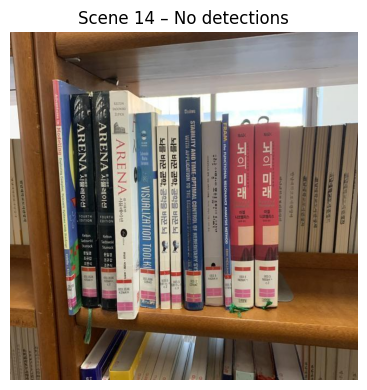

Scene 15 Book 11 – 2 instance(s) found:
 Instance 1 {top_left: (257, 187), top_right: (298, 187),bottom_left: (251, 534),  bottom_right: (292, 535),area: 14250px}
 Instance 2 {top_left: (217, 179), top_right: (259, 187),bottom_left: (213, 532),  bottom_right: (252, 515),area: 13765px}
Scene 15 Book 12 – 3 instance(s) found:
 Instance 1 {top_left: (499, 214), top_right: (529, 214),bottom_left: (494, 527),  bottom_right: (523, 526),area: 9216px}
 Instance 2 {top_left: (524, 213), top_right: (554, 216),bottom_left: (517, 519),  bottom_right: (546, 514),area: 8901px}
 Instance 3 {top_left: (473, 214), top_right: (504, 212),bottom_left: (468, 518),  bottom_right: (499, 534),area: 9738px}


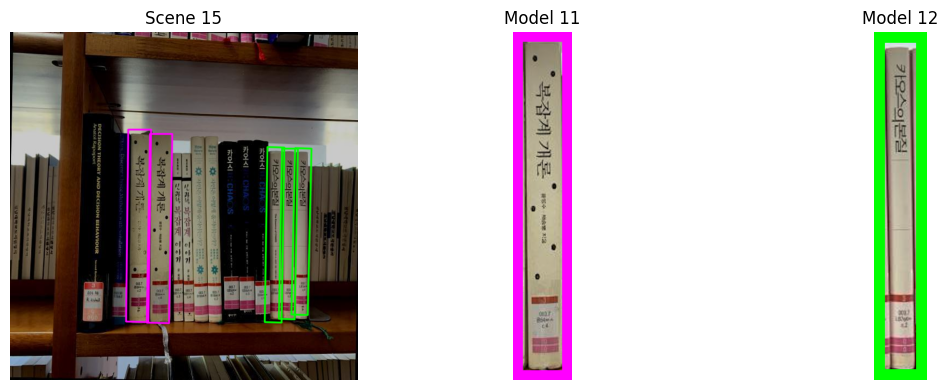

Scene 16 Book 11 – 2 instance(s) found:
 Instance 1 {top_left: (257, 186), top_right: (298, 188),bottom_left: (251, 535),  bottom_right: (292, 535),area: 14274px}
 Instance 2 {top_left: (217, 178), top_right: (259, 187),bottom_left: (213, 534),  bottom_right: (252, 514),area: 13800px}
Scene 16 Book 12 – 3 instance(s) found:
 Instance 1 {top_left: (500, 214), top_right: (528, 215),bottom_left: (494, 527),  bottom_right: (523, 527),area: 8909px}
 Instance 2 {top_left: (524, 213), top_right: (554, 216),bottom_left: (517, 520),  bottom_right: (546, 513),area: 8894px}
 Instance 3 {top_left: (473, 213), top_right: (506, 213),bottom_left: (463, 531),  bottom_right: (498, 540),area: 11005px}


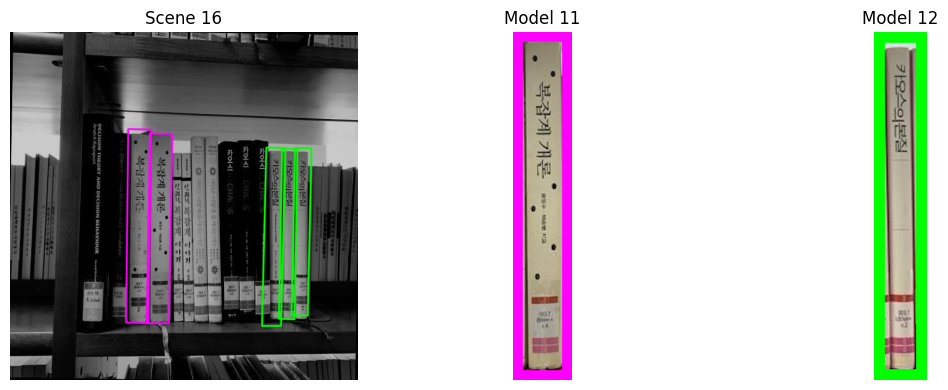

Scene 17 Book 11 – 2 instance(s) found:
 Instance 1 {top_left: (254, 187), top_right: (295, 187),bottom_left: (254, 535),  bottom_right: (295, 535),area: 14268px}
 Instance 2 {top_left: (213, 179), top_right: (256, 188),bottom_left: (217, 544),  bottom_right: (256, 513),area: 14167px}
Scene 17 Book 12 – 3 instance(s) found:
 Instance 1 {top_left: (497, 211), top_right: (526, 211),bottom_left: (497, 523),  bottom_right: (526, 523),area: 9048px}
 Instance 2 {top_left: (523, 211), top_right: (551, 211),bottom_left: (521, 533),  bottom_right: (550, 535),area: 9207px}
 Instance 3 {top_left: (470, 210), top_right: (503, 210),bottom_left: (465, 540),  bottom_right: (500, 533),area: 11087px}


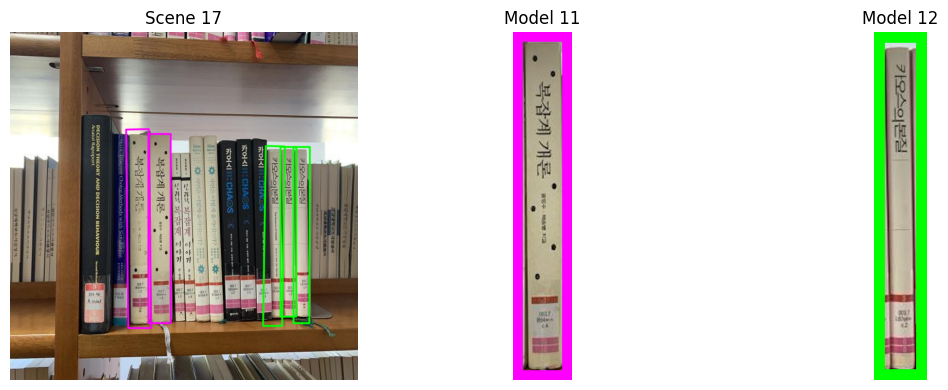

Scene 18 Book 8 – 2 instance(s) found:
 Instance 1 {top_left: (291, 131), top_right: (318, 131),bottom_left: (291, 586),  bottom_right: (318, 586),area: 12285px}
 Instance 2 {top_left: (266, 127), top_right: (293, 128),bottom_left: (264, 584),  bottom_right: (291, 585),area: 12341px}
Scene 18 Book 9 – 1 instance(s) found:
 Instance 1 {top_left: (315, 130), top_right: (342, 130),bottom_left: (315, 586),  bottom_right: (342, 586),area: 12312px}
Scene 18 Book 10 – 3 instance(s) found:
 Instance 1 {top_left: (108, 38), top_right: (135, 38),bottom_left: (108, 584),  bottom_right: (135, 584),area: 14742px}
 Instance 2 {top_left: (138, 43), top_right: (165, 42),bottom_left: (139, 585),  bottom_right: (165, 586),area: 14389px}
 Instance 3 {top_left: (77, 33), top_right: (104, 39),bottom_left: (79, 587),  bottom_right: (106, 579),area: 14771px}


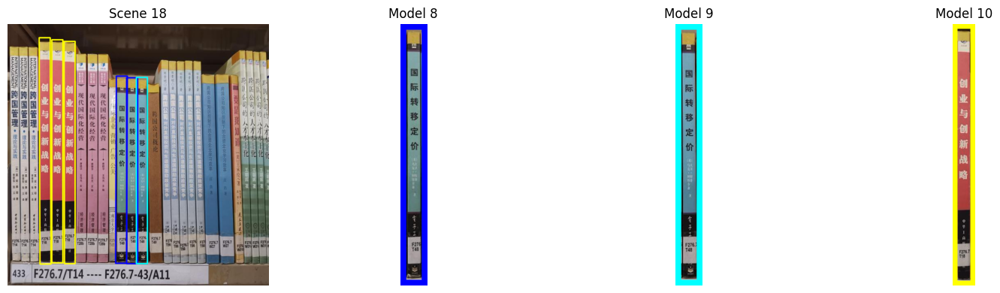

Scene 19 Book 6 – 3 instance(s) found:
 Instance 1 {top_left: (385, 32), top_right: (410, 32),bottom_left: (385, 579),  bottom_right: (410, 579),area: 13675px}
 Instance 2 {top_left: (411, 30), top_right: (437, 35),bottom_left: (407, 590),  bottom_right: (435, 584),area: 14970px}
 Instance 3 {top_left: (439, 25), top_right: (464, 27),bottom_left: (438, 579),  bottom_right: (463, 578),area: 13813px}
Scene 19 Book 7 – 2 instance(s) found:
 Instance 1 {top_left: (497, 40), top_right: (533, 40),bottom_left: (497, 587),  bottom_right: (533, 587),area: 19692px}
 Instance 2 {top_left: (458, 45), top_right: (494, 41),bottom_left: (459, 580),  bottom_right: (495, 585),area: 19421px}


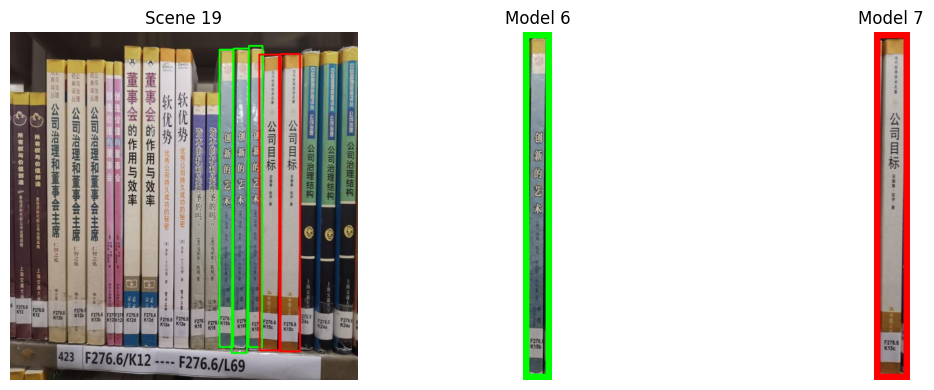

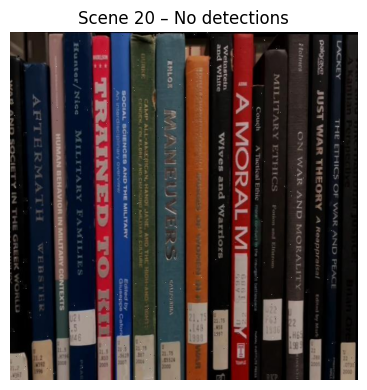

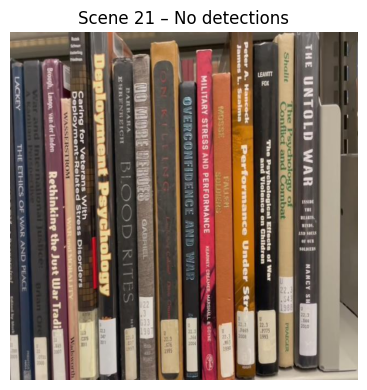

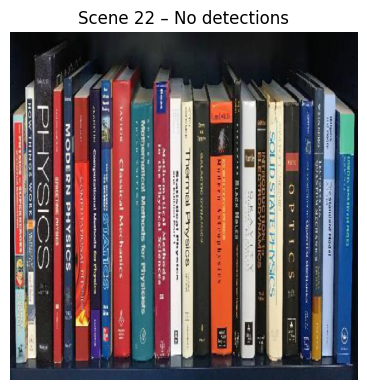

Scene 23 Book 5 – 1 instance(s) found:
 Instance 1 {top_left: (342, 149), top_right: (391, 149),bottom_left: (342, 571),  bottom_right: (391, 571),area: 20678px}


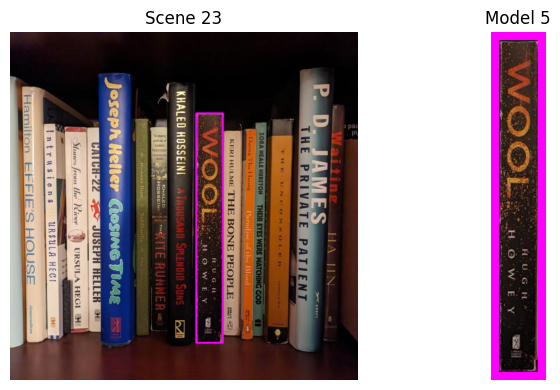

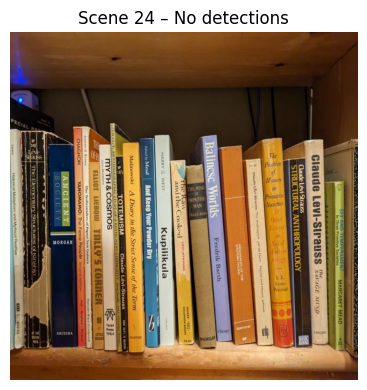

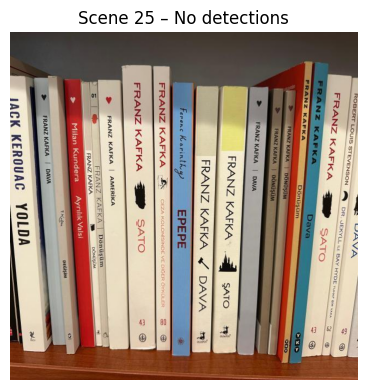

Scene 26 Book 0 – 2 instance(s) found:
 Instance 1 {top_left: (210, 180), top_right: (243, 180),bottom_left: (210, 567),  bottom_right: (243, 567),area: 12771px}
 Instance 2 {top_left: (170, 183), top_right: (204, 178),bottom_left: (175, 563),  bottom_right: (209, 575),area: 13191px}
Scene 26 Book 4 – 1 instance(s) found:
 Instance 1 {top_left: (248, 183), top_right: (432, 183),bottom_left: (248, 526),  bottom_right: (432, 526),area: 63112px}


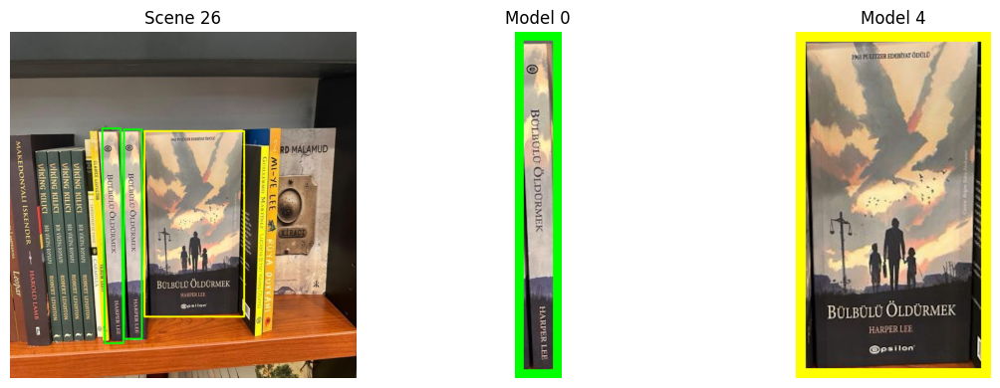

Scene 27 Book 2 – 2 instance(s) found:
 Instance 1 {top_left: (257, 146), top_right: (302, 146),bottom_left: (257, 563),  bottom_right: (302, 563),area: 18765px}
 Instance 2 {top_left: (304, 70), top_right: (371, 66),bottom_left: (300, 570),  bottom_right: (352, 575),area: 30023px}
Scene 27 Book 3 – 2 instance(s) found:
 Instance 1 {top_left: (416, 142), top_right: (466, 142),bottom_left: (400, 566),  bottom_right: (448, 565),area: 20743px}
 Instance 2 {top_left: (361, 90), top_right: (422, 81),bottom_left: (353, 578),  bottom_right: (403, 578),area: 27273px}


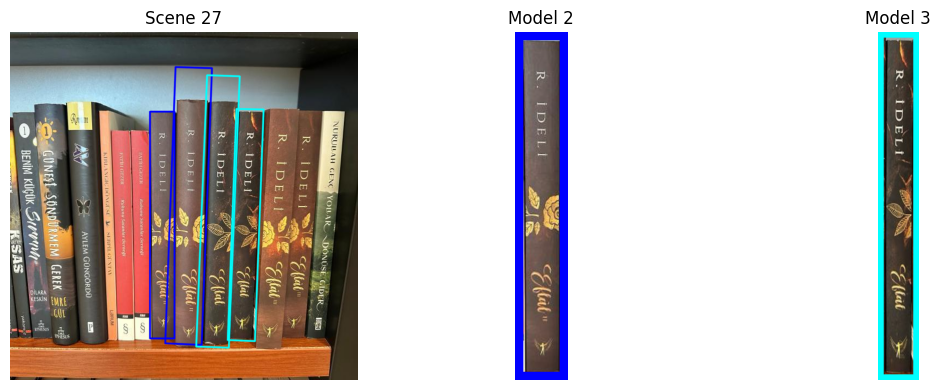

Scene 28 Book 1 – 2 instance(s) found:
 Instance 1 {top_left: (207, 247), top_right: (235, 248),bottom_left: (206, 554),  bottom_right: (235, 554),area: 8735px}
 Instance 2 {top_left: (237, 246), top_right: (265, 244),bottom_left: (236, 550),  bottom_right: (265, 551),area: 8706px}


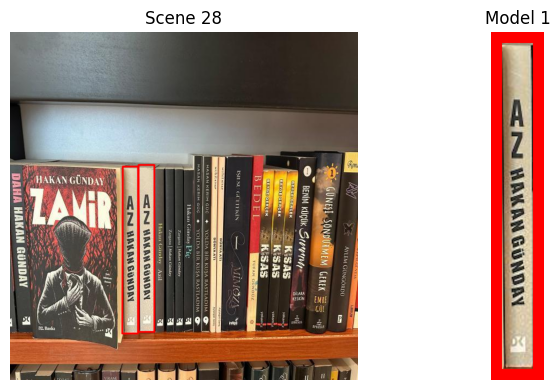

In [ ]:
# Initialize the FLANN matcher
flann = initialize_flann()

#-------------------------------
# Iterate over the scene images
#-------------------------------
for scene_index, scene_image in enumerate(scene_images):

    # copy for final scene containing all the bounding boxes
    final_scene_image = scene_image.copy()

    # store all the detections in the scene
    all_detections_in_scene = []
    model_detections = {} # {model_index:[detection_string]}

    #-------------------------------
    # Iterate over the model images
    #-------------------------------
    for model_index, model_image in enumerate(models_images):

      # Reset the state for each new model being checked against the scene
      remaining_kp_scene = list(kp_scenes[scene_index])
      remaining_des_scene = des_scenes[scene_index].copy() if des_scenes[scene_index] is not None else None

      #counter of the instance inside the model
      instance_count = 0
      #counter to when we reach the second instance
      kp_count_second=-1

      #we compute the HSV histogram of the model image for the color matching part
      model_image_hsv = cv2.cvtColor(models_images[model_index],cv2.COLOR_RGB2HSV)
      hist_model = get_hist(model_image_hsv)

      #--------------------------------------------
      # Iterate over the instances per model images
      #--------------------------------------------
      for _ in range(MAX_INSTANCES_PER_MODEL):


        # we check for sufficient features before attempting to match
        if remaining_des_scene is None or len(remaining_kp_scene) < MIN_MATCH_COUNT:
          break

        # we check for enough good matches before homography
        good_matches = feature_matching(
            flann,
            des_models[model_index],
            remaining_des_scene
            )
        if len(good_matches) < MIN_MATCH_COUNT:
          break # not enough good matches

        if instance_count == 1:
            kp_count_for_second_instance = len(good_matches)

        elif instance_count >= 2:
            current_kp_count = len(good_matches)
            # we check that from the third image the model has sufficient keypoint compared to the second one and so on
            # this ensures that if we have a drastically drop in keypoints we exclude (except from the first one which has many more since the model is taken from it)
            if kp_count_for_second_instance > 0 and current_kp_count < KP_RETENTION_T * kp_count_for_second_instance:
                break

        # start to compute homography
        M, _ = ransac_homography(kp_models[model_index], remaining_kp_scene, good_matches)
        if M is None:
          break

        # we compute the new corners
        dst_corners = apply_homography(model_image, M)

        # We found a potential match, now we validate it as explained in the introduction
        valid, reason = check_valid(
            dst_corners,
            scene_images[scene_index],
            hist_model,
            MIN_DETECTION_AREA,
            MAX_DETECTION_AREA,
            ANGLE_COS_TOLERANCE,
            COLOR_HIST_THRESHOLD
            )

        if valid:
          #store detection
          instance_count += 1
          all_detections_in_scene.append({
              'corners': dst_corners,
              'model_id': model_index
          })

          # Store the formatted detection string
          if model_index not in model_detections:
            model_detections[model_index] = []

          #corners are converted as integers from floats to be better representable
          corners = dst_corners.astype(int)

          #we compute the area
          area = cv2.contourArea(corners)

          #we save the results in the dictionary
          model_detections[model_index].append(
          f" Instance {instance_count} {{top_left: {tuple(map(int, corners[0][0]))}, "
          f"top_right: {tuple(map(int, corners[3][0]))},bottom_left: {tuple(map(int, corners[1][0]))}, "
          f" bottom_right: {tuple(map(int, corners[2][0]))},area: {int(area)}px}}"
          )

          # we remove keypoints of the valid detection to avoid re-detecting it
          remaining_kp_scene, remaining_des_scene = delete_keypoints(
              remaining_kp_scene, remaining_des_scene, dst_corners
          )

        else:
          #if the colors do not match, another instance could be present in the scene of the model image (previous books discarder but very similar with different colors)
          if reason=="Colors do not match":
            remaining_kp_scene,remaining_des_scene = delete_keypoints(remaining_kp_scene,remaining_des_scene,dst_corners)
            continue
          break

    #---------------------------
    # visualization part
    #---------------------------
    if not all_detections_in_scene:
      # scene image without matches
      plt.figure(figsize=(4,4))
      plt.subplot(1, 1, 1)
      plt.imshow(final_scene_image)
      plt.title(f"Scene {scene_index} – No detections", fontsize=12)
      plt.axis('off')
      plt.tight_layout()
      plt.show()
    else:
        for model_id, instances in model_detections.items():
          #we print the text
            print(f"Scene {scene_index} Book {model_id} – {len(instances)} instance(s) found:")
            for instance_str in instances:
                print(instance_str)

        # Draw bounding boxes for all detections
        for detection in all_detections_in_scene:
            corners = detection['corners']
            model_id = detection['model_id']
            color = MODEL_COLORS[model_id%len(MODEL_COLORS)]
            draw_bounding_box(final_scene_image,corners,color)

        detected_model_ids = list(model_detections.keys())
        num_detections = len(detected_model_ids)

        plt.figure(figsize=(4 * (1 + num_detections), 4))

        # We plot the final scene image with bounding boxes
        plt.subplot(1, 1 + num_detections, 1)
        plt.imshow(final_scene_image)
        plt.title(f"Scene {scene_index}")
        plt.axis('off')

        # We show each detected model image in the specific scene image
        for i, model_id in enumerate(detected_model_ids):
            model_img = models_images[model_id]
            color = MODEL_COLORS[model_id % len(MODEL_COLORS)]


            border_size=20

            # we create the new image with the right color added to clearly understand where it was detected
            bordered_model_img = cv2.copyMakeBorder(
                model_img,
                top=border_size,
                bottom=border_size,
                left=border_size,
                right=border_size,
                borderType=cv2.BORDER_CONSTANT,
                value=color
            )

            plt.subplot(1, 1 + num_detections, 2 + i)
            plt.imshow(bordered_model_img)
            plt.title(f"Model {model_id}")
            plt.axis('off')

        plt.tight_layout()
        plt.show()


## Results
All the instances are correctly detected, setting the parameters of the SIFT seemed to be the key for the **100% accuracy**, the validation controls on shape color and angles were used to cut out false positives since the edge Threshold of the algorithm is kept very low.
The computation using low threshold, which made us find many keypoints is not the lightest but we obtained the best accuracy possible detecting all the books.
The homographies, having many keypoints worked well for all the instances and we are satisfied with the results.

They key changes that made the model perform very precisely was setting correctly the hyperparameters of the SIFT function, that resulted in more keypoints found and more matches, with the strong post-processing of false-positive the overall algorithm is very reliable.